In [ ]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
train_path = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Train'
test_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Test'
def create_df(path):
    files, labels = [], []
    if not os.path.exists(path):
        return pd.DataFrame(columns=['filename', 'class'])

    for category in ['Edible', 'Poisonous']:
        cat_path = os.path.join(path, category)
        if os.path.exists(cat_path):
            for species in os.listdir(cat_path):
                species_path = os.path.join(cat_path, species)
                if os.path.isdir(species_path):
                    for f in os.listdir(species_path):
                        if f.lower().endswith(('png', 'jpg', 'jpeg')):
                            files.append(os.path.join(species_path, f))
                            labels.append(species)
    return pd.DataFrame({'filename': files, 'class': labels})

df = create_df(train_path)

if len(df) > 0:
    df_train, df_val = train_test_split(
        df,
        test_size=0.1,
        stratify=df['class'],
        random_state=42
    )

    test_count = 0
    if os.path.exists(test_path):
        for category in ['Edible', 'Poisonous']:
            cat_path = os.path.join(test_path, category)
            if os.path.exists(cat_path):
                for species in os.listdir(cat_path):
                    species_path = os.path.join(cat_path, species)
                    if os.path.isdir(species_path):
                        test_count += len([f for f in os.listdir(species_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))])

    print("==================================================")
    print("       LAPORAN RINCIAN DATASET AKTIF      ")
    print("==================================================")
    print(f"Data Training (df_train)    : {len(df_train)} citra")
    print(f"Data Validation (df_val)    : {len(df_val)} citra")
    print(f"Data Testing (Folder fisik) : {test_count} citra")
    print("--------------------------------------------------")
    grand_total = len(df_train) + len(df_val) + test_count
    print(f"GRAND TOTAL DATASET BERSIH  : {grand_total} CITRA")
    print("==================================================")
else:
    print("[PERINGATAN] Dataset tidak ditemukan. Periksa kembali path 'SplitNew' abang.")

       LAPORAN RINCIAN DATASET AKTIF      
Data Training (df_train)    : 13081 citra
Data Validation (df_val)    : 1454 citra
Data Testing (Folder fisik) : 1615 citra
--------------------------------------------------
GRAND TOTAL DATASET BERSIH  : 16150 CITRA


In [ ]:
import os

raw_path = '/content/drive/MyDrive/Dataset_TugasAkhir/Raw'

total_images = 0

print("=== JUMLAH GAMBAR PER SPESIES ===\n")

for category in ['Edible', 'Poisonous']:
    print(f"\n[{category}]")

    category_total = 0

    cat_path = os.path.join(raw_path, category)

    for species in sorted(os.listdir(cat_path)):
        species_path = os.path.join(cat_path, species)

        if os.path.isdir(species_path):
            count = len([
                f for f in os.listdir(species_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))
            ])

            print(f"{species:<25} : {count}")

            category_total += count
            total_images += count

    print(f"Total {category}: {category_total}")

print("\n==============================")
print(f"TOTAL SELURUH DATASET: {total_images}")

=== JUMLAH GAMBAR PER SPESIES ===


[Edible]
Boletus_edulis            : 1063
Cantharellus_cibarius     : 755
Coprinus_comatus          : 1239
Flammulina_velutipes      : 679
Leccinum_scabrum          : 1678
Lycoperdon_perlatum       : 1056
Macrolepiota_procera      : 860
Pleurotus_ostreatus       : 505
Suillus_granulatus        : 357
Verpa_bohemica            : 776
Total Edible: 8968

[Poisonous]
Amanita_muscaria          : 1295
Amanita_pantherina        : 302
Amanita_rubescens         : 516
Clitocybe_nebularis       : 399
Fomitopsis_pinicola       : 1461
Gyromitra_gigas           : 1408
Lactarius_torminosus      : 332
Paxillus_involutus        : 818
Pholiota_squarrosa        : 334
Stropharia_aeruginosa     : 317
Total Poisonous: 7182

TOTAL SELURUH DATASET: 16150


In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 6.4 MB/s eta 0:00:00


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 23.3 MB/s eta 0:00:00


In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
import os

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import keras_tuner as kt

# PATH
train_path = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Train'
test_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Test'
save_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/Models'

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# CREATE DATAFRAME
def create_df(path):
    files, labels = [], []
    for category in ['Edible', 'Poisonous']:
        cat_path = os.path.join(path, category)
        for species in os.listdir(cat_path):
            species_path = os.path.join(cat_path, species)
            if os.path.isdir(species_path):
                for f in os.listdir(species_path):
                    if f.lower().endswith(('png', 'jpg', 'jpeg')):
                        files.append(os.path.join(species_path, f))
                        labels.append(species)
    return pd.DataFrame({'filename': files, 'class': labels})

df = create_df(train_path)

df_train, df_val = train_test_split(
    df,
    test_size=0.1,
    stratify=df['class'],
    random_state=42
)

# DATA GENERATOR
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=30,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_base = train_datagen.flow_from_dataframe(
    df_train,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_base = val_datagen.flow_from_dataframe(
    df_val,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# BINARY MAPPING
class_indices = train_base.class_indices
edible_species = os.listdir(os.path.join(train_path, 'Edible'))

edible_indices = [v for k, v in class_indices.items() if k in edible_species]

# AUTOMATIC JSON EXPORT (Biar sel prediksi murni & hybrid nanti tidak error)
import json
os.makedirs(save_path, exist_ok=True)
with open(os.path.join(save_path, 'class_indices.json'), 'w') as f:
    json.dump(class_indices, f)

def multi_output_generator(gen):
    while True:
        x, y_sp = next(gen)
        idx = np.argmax(y_sp, axis=1)
        y_bin = np.array([0 if i in edible_indices else 1 for i in idx]).astype('float32')
        yield x, {'output_biner': y_bin, 'output_spesies': y_sp}

train_gen = multi_output_generator(train_base)
val_gen = multi_output_generator(val_base)

# FUNCTION BUILD_MODEL
def build_model(hp):

    input_layer = Input(shape=(224, 224, 3))

    base_model = ResNet50(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )

    for layer in base_model.layers:
        layer.trainable = False

    x = GlobalAveragePooling2D()(base_model.output)

    # TUNING: jumlah hidden dense layer (1-2)
    num_layers = hp.Int('num_dense_layers', min_value=1, max_value=2, step=1)

    for i in range(num_layers):
        x = Dense(
            units=hp.Choice(f'dense_units_{i}', values=[128, 256, 512, 1024]),
            activation='relu'
        )(x)
        x = Dropout(
            rate=hp.Choice(f'dropout_{i}', values=[0.2, 0.3, 0.4, 0.5])
        )(x)

    out_bin = Dense(1, activation='sigmoid', name='output_biner')(x)

    # PERBAIKAN DI SINI: Menggunakan len(class_indices) secara langsung agar sinkron
    out_sp = Dense(len(class_indices), activation='softmax', name='output_spesies')(x)

    model = Model(inputs=input_layer, outputs=[out_bin, out_sp])

    # TETEP IKUT JURNAL: Learning Rate [1e-1, 1e-2, 1e-4, 1e-6]
    lr = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-4, 1e-6])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss={
            'output_biner': 'binary_crossentropy',
            'output_spesies': 'categorical_crossentropy'
        },
        metrics={
            'output_biner': 'accuracy',
            'output_spesies': 'accuracy'
        }
    )

    return model

# CALLBACKS
checkpoint = ModelCheckpoint(
    filepath=os.path.join(save_path, 'best_model_resnet_tuned_v4.keras'),
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.3, patience=3),
    checkpoint
]

# TUNER
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    directory='/content/drive/MyDrive/keras_tuner',
    project_name='resnet_mushroom_v4'
)

# SEARCH
tuner.search(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=10,
    callbacks=callbacks
)

# BEST MODEL
best_hps = tuner.get_best_hyperparameters(1)[0]

print("Jumlah Dense Layer :", best_hps.get('num_dense_layers'))

print("Dense 0 :", best_hps.get('dense_units_0'))

if best_hps.get('num_dense_layers') == 2:
    print("Dense 1 :", best_hps.get('dense_units_1'))

print("Learning Rate :", best_hps.get('learning_rate'))

model = tuner.hypermodel.build(best_hps)

# TRAIN FINAL
history = model.fit(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=15,
    callbacks=callbacks
)

Trial 10 Complete [00h 42m 38s]
val_loss: 0.7960928082466125

Best val_loss So Far: 0.7913836240768433
Total elapsed time: 08h 29m 24s
Jumlah Dense Layer : 1
Dense 0 : 256
Learning Rate : 0.0001
Epoch 1/15
408/408 ━━━━━━━━━━━━━━━━━━━━ 0s 608ms/step - loss: 3.3555 - output_biner_accuracy: 0.6176 - output_biner_loss: 0.6780 - output_spesies_accuracy: 0.2598 - output_spesies_loss: 2.6775
Epoch 1: val_loss improved from None to 1.56154, saving model to /content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_resnet_tuned_v4.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_resnet_tuned_v4.keras
408/408 ━━━━━━━━━━━━━━━━━━━━ 282s 659ms/step - loss: 2.7732 - output_biner_accuracy: 0.6854 - output_biner_loss: 0.5891 - output_spesies_accuracy: 0.3744 - output_spesies_loss: 2.1837 - val_loss: 1.5615 - val_output_biner_accuracy: 0.8249 - val_output_biner_loss: 0.4093 - val_output_spesies_accuracy: 0.6730 - val_output_spesies_loss: 1.1458 - lea

In [ ]:
print(f"Total layer: {len(model.layers)}")
print(f"Layer 174: {model.layers[174].name}")
print(f"Layer 175: {model.layers[175].name}")

Total layer: 180
Layer 174: conv5_block3_out
Layer 175: global_average_pooling2d_1


In [ ]:
# FINE TUNING (METODE FLAT LAYER)
print("\nFINE TUNING START")

print(f"Total seluruh layer di model: {len(model.layers)}")

resnet_end_idx = 174

# 1. Bekukan SEMUA layer
for layer in model.layers:
    layer.trainable = False

# 2. Buka kunci layer klasifikasi (index 175 ke atas)
for layer in model.layers[resnet_end_idx + 1:]:
    layer.trainable = True
    print(f"Unfreezing head layer: {layer.name}")

# 3. Buka 30 layer TERAKHIR ResNet50
start_unfreeze = resnet_end_idx - 30
for layer in model.layers[start_unfreeze: resnet_end_idx + 1]:
    layer.trainable = True
    print(f"Unfreezing ResNet layer: {layer.name}")

# Re-Compile
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss={
        'output_biner': 'binary_crossentropy',
        'output_spesies': 'categorical_crossentropy'
    },
    metrics={
        'output_biner': 'accuracy',
        'output_spesies': 'accuracy'
    }
)

print("\nModel Re-Compiled. Memulai Fine-Tuning...")

history_finetune = model.fit(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=20,
    callbacks=callbacks
)


FINE TUNING START
Total seluruh layer di model: 180
Unfreezing head layer: global_average_pooling2d_1
Unfreezing head layer: dense_1
Unfreezing head layer: dropout_1
Unfreezing head layer: output_biner
Unfreezing head layer: output_spesies
Unfreezing ResNet layer: conv5_block1_1_bn
Unfreezing ResNet layer: conv5_block1_1_relu
Unfreezing ResNet layer: conv5_block1_2_conv
Unfreezing ResNet layer: conv5_block1_2_bn
Unfreezing ResNet layer: conv5_block1_2_relu
Unfreezing ResNet layer: conv5_block1_0_conv
Unfreezing ResNet layer: conv5_block1_3_conv
Unfreezing ResNet layer: conv5_block1_0_bn
Unfreezing ResNet layer: conv5_block1_3_bn
Unfreezing ResNet layer: conv5_block1_add
Unfreezing ResNet layer: conv5_block1_out
Unfreezing ResNet layer: conv5_block2_1_conv
Unfreezing ResNet layer: conv5_block2_1_bn
Unfreezing ResNet layer: conv5_block2_1_relu
Unfreezing ResNet layer: conv5_block2_2_conv
Unfreezing ResNet layer: conv5_block2_2_bn
Unfreezing ResNet layer: conv5_block2_2_relu
Unfreezing R

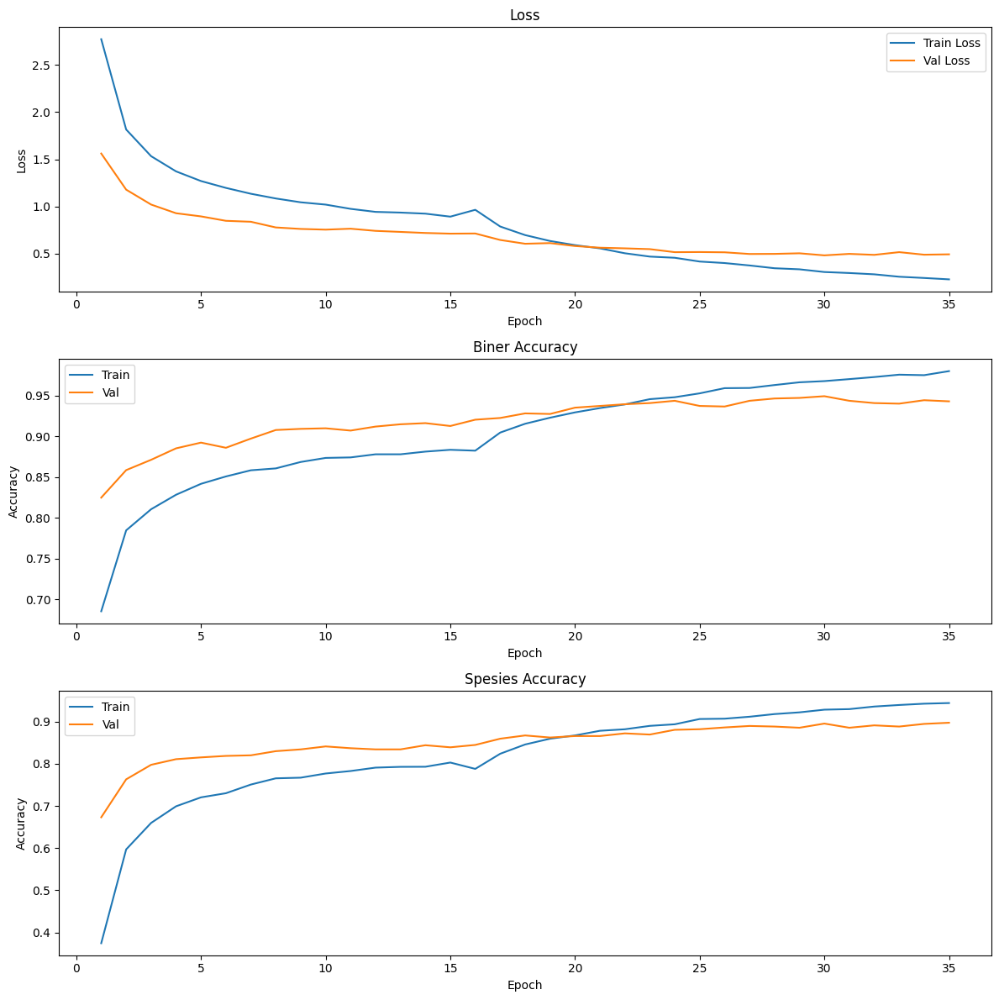

In [ ]:
import matplotlib.pyplot as plt

# =========================
# GABUNG HISTORY
# =========================
loss = history.history['loss'] + history_finetune.history['loss']
val_loss = history.history['val_loss'] + history_finetune.history['val_loss']

bin_acc = history.history['output_biner_accuracy'] + history_finetune.history['output_biner_accuracy']
val_bin_acc = history.history['val_output_biner_accuracy'] + history_finetune.history['val_output_biner_accuracy']

sp_acc = history.history['output_spesies_accuracy'] + history_finetune.history['output_spesies_accuracy']
val_sp_acc = history.history['val_output_spesies_accuracy'] + history_finetune.history['val_output_spesies_accuracy']

epochs = range(1, len(loss) + 1)
# PLOT

plt.figure(figsize=(12, 12))

# LOSS
plt.subplot(3, 1, 1)
plt.plot(epochs, loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Val Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# BINER ACCURACY
plt.subplot(3, 1, 2)
plt.plot(epochs, bin_acc, label='Train')
plt.plot(epochs, val_bin_acc, label='Val')
plt.title('Biner Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# SPESIES ACCURACY
plt.subplot(3, 1, 3)
plt.plot(epochs, sp_acc, label='Train')
plt.plot(epochs, val_sp_acc, label='Val')
plt.title('Spesies Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import keras_tuner as kt
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model

# Definisikan ulang build_model dulu
def build_model(hp):
    input_layer = Input(shape=(224, 224, 3))
    base_model = ResNet50(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )
    for layer in base_model.layers:
        layer.trainable = False

    x = GlobalAveragePooling2D()(base_model.output)

    num_layers = hp.Int('num_dense_layers', min_value=1, max_value=2, step=1)
    for i in range(num_layers):
        x = Dense(
            units=hp.Choice(f'dense_units_{i}', values=[128, 256, 512, 1024]),
            activation='relu'
        )(x)
        x = Dropout(
            rate=hp.Choice(f'dropout_{i}', values=[0.2, 0.3, 0.4, 0.5])
        )(x)

    out_bin = Dense(1, activation='sigmoid', name='output_biner')(x)
    out_sp = Dense(20, activation='softmax', name='output_spesies')(x)

    model = Model(inputs=input_layer, outputs=[out_bin, out_sp])

    lr = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-4, 1e-6])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss={
            'output_biner': 'binary_crossentropy',
            'output_spesies': 'categorical_crossentropy'
        },
        metrics={
            'output_biner': 'accuracy',
            'output_spesies': 'accuracy'
        }
    )
    return model

# RELOAD TUNER
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    directory='/content/drive/MyDrive/keras_tuner',
    project_name='resnet_mushroom_v4'
)

# AMBIL BEST HP
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("\n" + "="*40)
print("=== HYPERPARAMETER TERBAIK ===")
print("="*40)
print(f"Learning Rate      : {best_hps.get('learning_rate')}")
print(f"Jumlah Dense Layer : {best_hps.get('num_dense_layers')}")
print("-"*40)

num_layers = best_hps.get('num_dense_layers')
for i in range(num_layers):
    print(f"Dense Layer {i+1}:")
    print(f"  Units   : {best_hps.get(f'dense_units_{i}')}")
    print(f"  Dropout : {best_hps.get(f'dropout_{i}'):.2f}")
    print("-"*40)

tuner.results_summary()

Reloading Tuner from /content/drive/MyDrive/keras_tuner/resnet_mushroom_v4/tuner0.json

=== HYPERPARAMETER TERBAIK ===
Learning Rate      : 0.0001
Jumlah Dense Layer : 1
----------------------------------------
Dense Layer 1:
  Units   : 256
  Dropout : 0.50
----------------------------------------
Results summary
Results in /content/drive/MyDrive/keras_tuner/resnet_mushroom_v4
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 04 summary
Hyperparameters:
num_dense_layers: 1
dense_units_0: 256
dropout_0: 0.5
learning_rate: 0.0001
dense_units_1: 256
dropout_1: 0.2
Score: 0.7913836240768433

Trial 09 summary
Hyperparameters:
num_dense_layers: 1
dense_units_0: 128
dropout_0: 0.4
learning_rate: 0.0001
dense_units_1: 128
dropout_1: 0.4
Score: 0.7960928082466125

Trial 02 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 128
dropout_0: 0.5
learning_rate: 0.0001
dense_units_1: 256
dropout_1: 0.5
Score: 0.8943758010864258

Trial 01 summary
Hyperparameters:
num_

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 54,079,937 (206.30 MB)

 Trainable params: 14,981,141 (57.15 MB)

 Non-trainable params: 9,136,512 (34.85 MB)

 Optimizer params: 29,962,284 (114.30 MB)

In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
from sklearn.metrics import classification_report

# --- PATH ---
train_path = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Train'
test_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Test'
save_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/Models'

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# --- FUNCTION SCAN DATA ---
def create_df(path):
    files, labels = [], []
    for category in ['Edible', 'Poisonous']:
        cat_path = os.path.join(path, category)
        for species in os.listdir(cat_path):
            species_path = os.path.join(cat_path, species)
            if os.path.isdir(species_path):
                for f in os.listdir(species_path):
                    if f.lower().endswith(('png','jpg','jpeg')):
                        files.append(os.path.join(species_path, f))
                        labels.append(species)
    return pd.DataFrame({'filename': files, 'class': labels})

# --- LOAD MODEL ---
print("Loading model...")
model = tf.keras.models.load_model(
    os.path.join(save_path, 'best_model_resnet_tuned_v4.keras')
)

# --- LOAD TEST DATA ---
print("Scanning test dataset...")
df_test = create_df(test_path)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_base = test_datagen.flow_from_dataframe(
    df_test,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# --- PREDIKSI ---
print("Predicting...")
y_pred = model.predict(test_base)

# OUTPUT MODEL
pred_biner = (y_pred[0] > 0.5).astype(int).flatten()
pred_spesies = np.argmax(y_pred[1], axis=1)

# GROUND TRUTH
y_true_spesies = test_base.classes

# --- LABEL SPESIES ---
target_names = sorted(
    test_base.class_indices,
    key=test_base.class_indices.get
)

# --- MAPPING BINER ---
test_class_indices = test_base.class_indices
edible_species = os.listdir(os.path.join(train_path, 'Edible'))

edible_indices_test = [
    v for k, v in test_class_indices.items()
    if k in edible_species
]

y_true_biner = np.array([
    0 if i in edible_indices_test else 1
    for i in y_true_spesies
])

#  HASIL EVALUASI
print("\n=== HASIL BINER ===")
print(classification_report(
    y_true_biner,
    pred_biner,
    target_names=['Edible','Poisonous'],
    digits=4
))

print("\n=== HASIL SPESIES ===")
print(classification_report(
    y_true_spesies,
    pred_spesies,
    target_names=target_names,
    digits=4
))

from sklearn.metrics import accuracy_score

print("Accuracy Biner:", accuracy_score(y_true_biner, pred_biner))
print("Accuracy Spesies:", accuracy_score(y_true_spesies, pred_spesies))

Loading model...
Scanning test dataset...
Found 1615 validated image filenames belonging to 20 classes.
Predicting...
51/51 ━━━━━━━━━━━━━━━━━━━━ 620s 12s/step

=== HASIL BINER ===
              precision    recall  f1-score   support

      Edible     0.9339    0.9766    0.9548       897
   Poisonous     0.9690    0.9136    0.9405       718

    accuracy                         0.9486      1615
   macro avg     0.9514    0.9451    0.9476      1615
weighted avg     0.9495    0.9486    0.9484      1615


=== HASIL SPESIES ===
                       precision    recall  f1-score   support

     Amanita_muscaria     0.9254    0.9612    0.9430       129
   Amanita_pantherina     0.7667    0.7667    0.7667        30
    Amanita_rubescens     0.7556    0.6538    0.7010        52
       Boletus_edulis     0.8333    0.8491    0.8411       106
Cantharellus_cibarius     0.9000    0.9600    0.9290        75
  Clitocybe_nebularis     0.7442    0.8000    0.7711        40
     Coprinus_comatus     0.

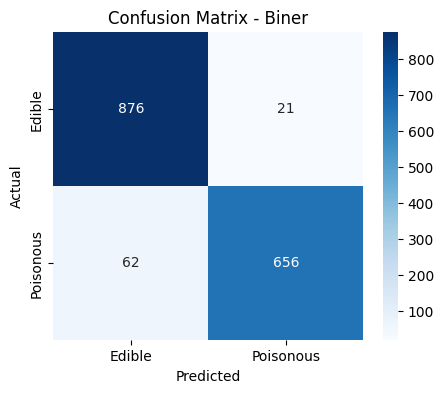

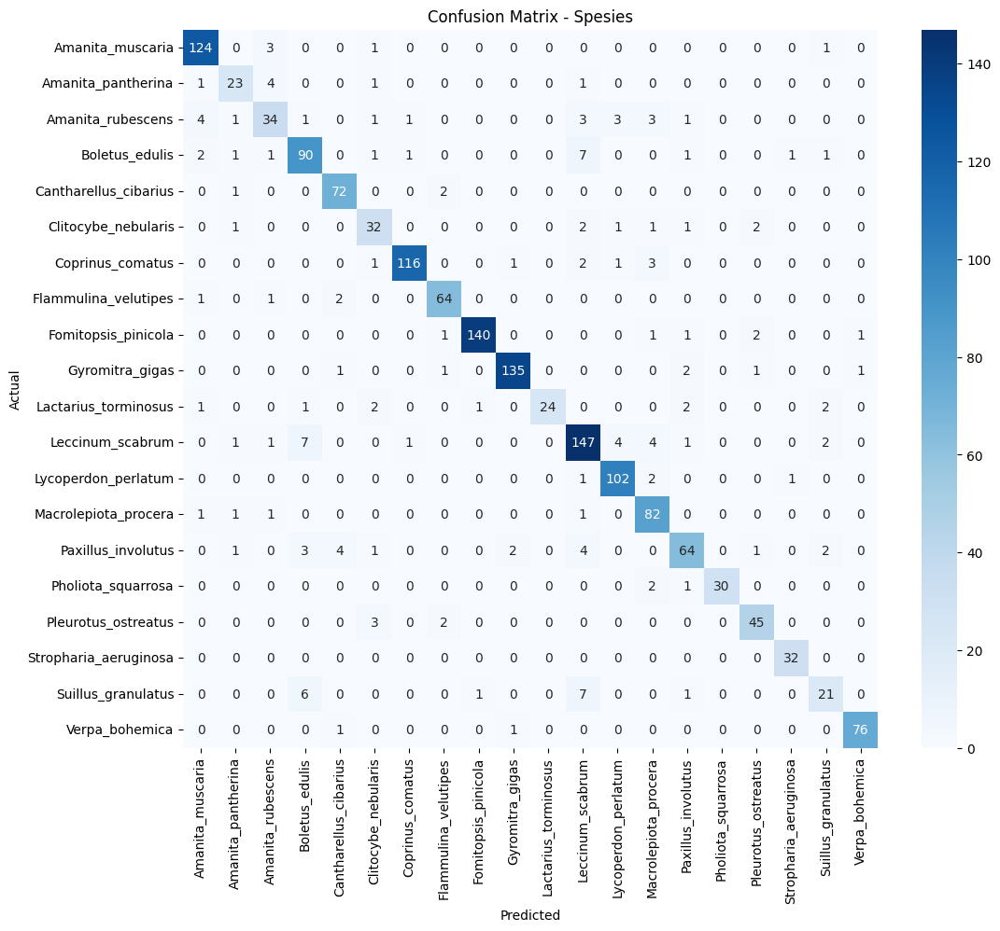

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# CONFUSION MATRIX BINER
cm_bin = confusion_matrix(y_true_biner, pred_biner)

plt.figure(figsize=(5,4))
sns.heatmap(cm_bin, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Edible','Poisonous'],
            yticklabels=['Edible','Poisonous'])
plt.title('Confusion Matrix - Biner')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# CONFUSION MATRIX SPESIES

cm_sp = confusion_matrix(y_true_spesies, pred_spesies)

plt.figure(figsize=(12,10))
sns.heatmap(cm_sp, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.title('Confusion Matrix - Spesies')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

Loading ResNet50 model...
Loading class mapping...
Model dan Mapping siap!

Memulai prediksi folder...



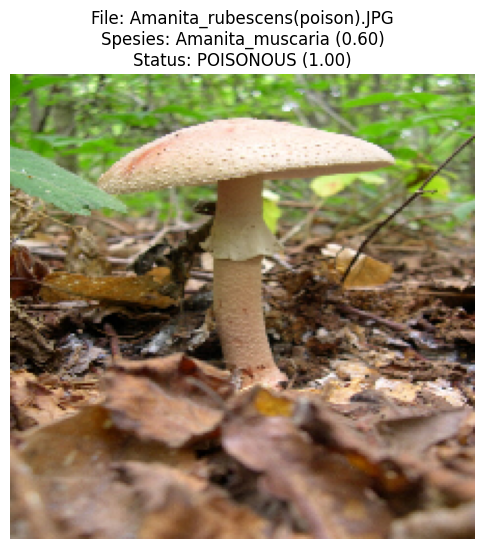

File    : Amanita_rubescens(poison).JPG
Spesies : Amanita_muscaria (60.09%)
Status  : POISONOUS (99.87%)
----------------------------------------


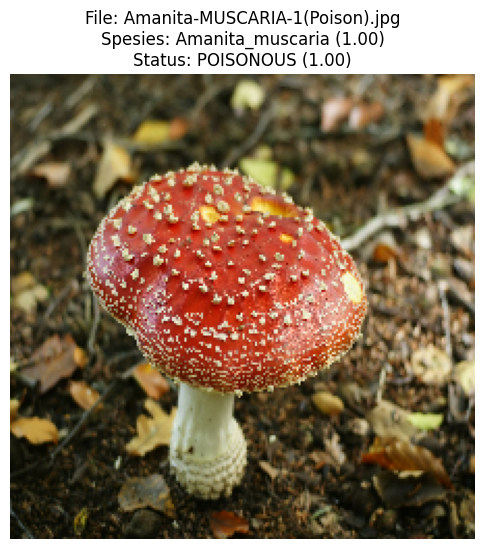

File    : Amanita-MUSCARIA-1(Poison).jpg
Spesies : Amanita_muscaria (99.95%)
Status  : POISONOUS (100.00%)
----------------------------------------


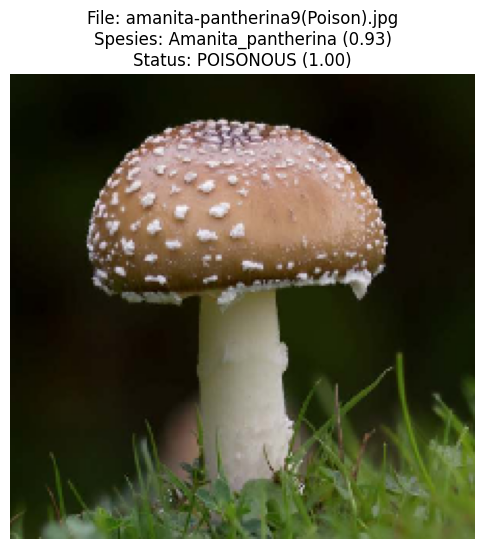

File    : amanita-pantherina9(Poison).jpg
Spesies : Amanita_pantherina (93.49%)
Status  : POISONOUS (100.00%)
----------------------------------------


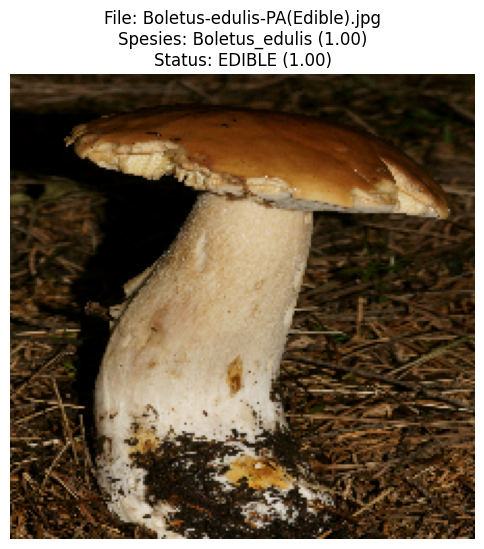

File    : Boletus-edulis-PA(Edible).jpg
Spesies : Boletus_edulis (99.82%)
Status  : EDIBLE (99.95%)
----------------------------------------


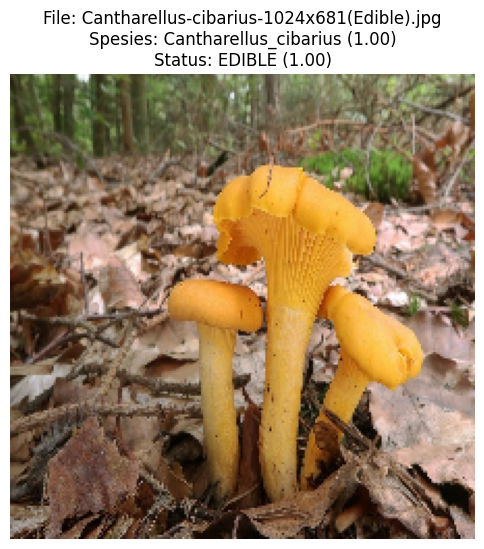

File    : Cantharellus-cibarius-1024x681(Edible).jpg
Spesies : Cantharellus_cibarius (99.89%)
Status  : EDIBLE (99.99%)
----------------------------------------


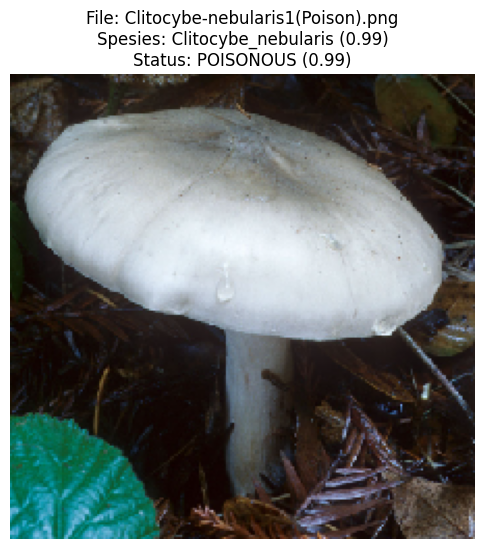

File    : Clitocybe-nebularis1(Poison).png
Spesies : Clitocybe_nebularis (99.10%)
Status  : POISONOUS (99.13%)
----------------------------------------


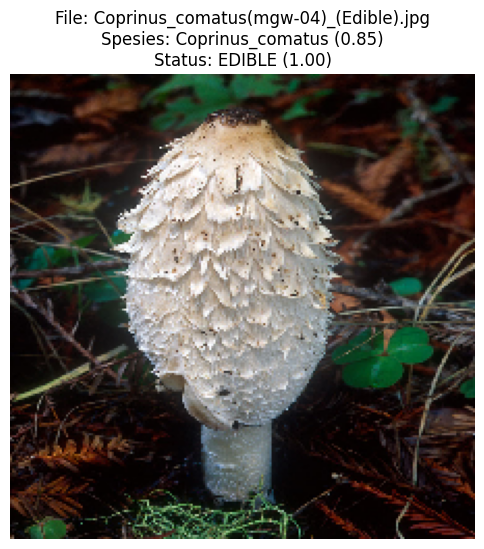

File    : Coprinus_comatus(mgw-04)_(Edible).jpg
Spesies : Coprinus_comatus (85.12%)
Status  : EDIBLE (99.98%)
----------------------------------------


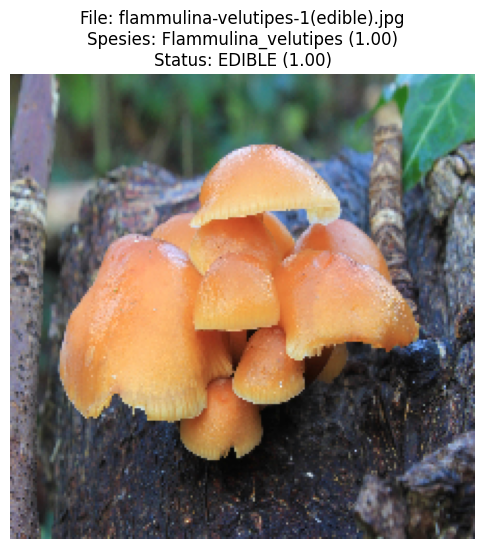

File    : flammulina-velutipes-1(edible).jpg
Spesies : Flammulina_velutipes (99.95%)
Status  : EDIBLE (99.79%)
----------------------------------------


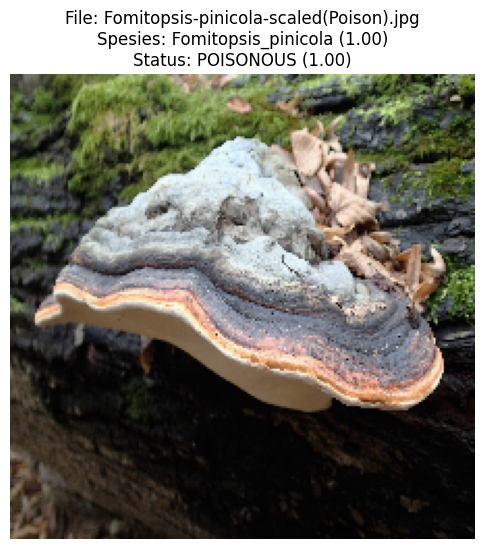

File    : Fomitopsis-pinicola-scaled(Poison).jpg
Spesies : Fomitopsis_pinicola (100.00%)
Status  : POISONOUS (99.96%)
----------------------------------------


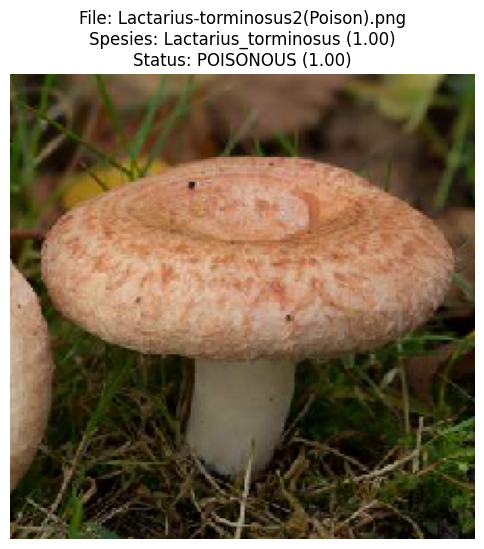

File    : Lactarius-torminosus2(Poison).png
Spesies : Lactarius_torminosus (99.98%)
Status  : POISONOUS (99.99%)
----------------------------------------


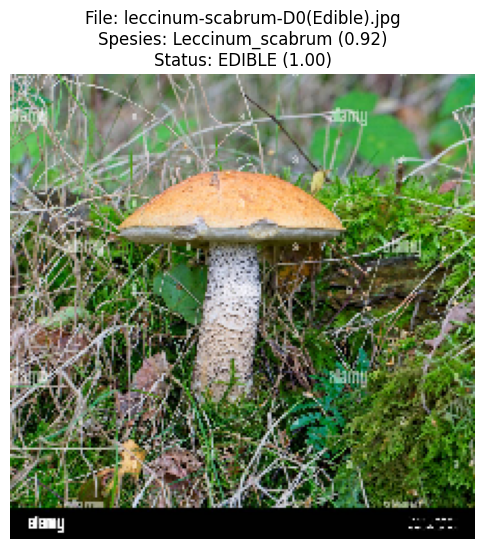

File    : leccinum-scabrum-D0(Edible).jpg
Spesies : Leccinum_scabrum (92.09%)
Status  : EDIBLE (99.77%)
----------------------------------------


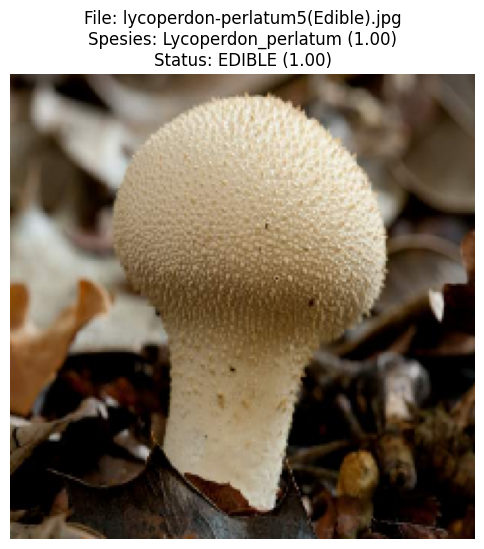

File    : lycoperdon-perlatum5(Edible).jpg
Spesies : Lycoperdon_perlatum (100.00%)
Status  : EDIBLE (100.00%)
----------------------------------------


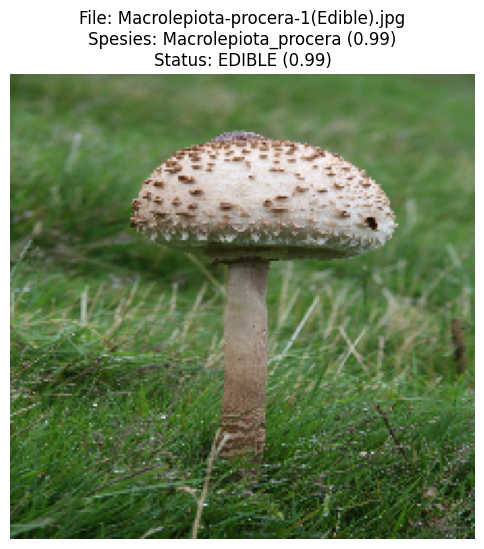

File    : Macrolepiota-procera-1(Edible).jpg
Spesies : Macrolepiota_procera (99.33%)
Status  : EDIBLE (98.54%)
----------------------------------------


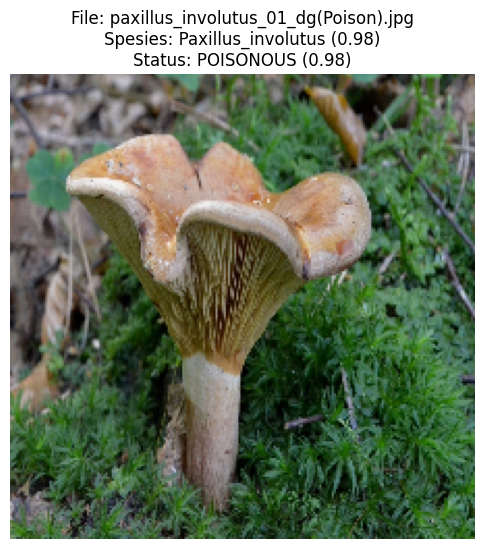

File    : paxillus_involutus_01_dg(Poison).jpg
Spesies : Paxillus_involutus (97.79%)
Status  : POISONOUS (97.99%)
----------------------------------------


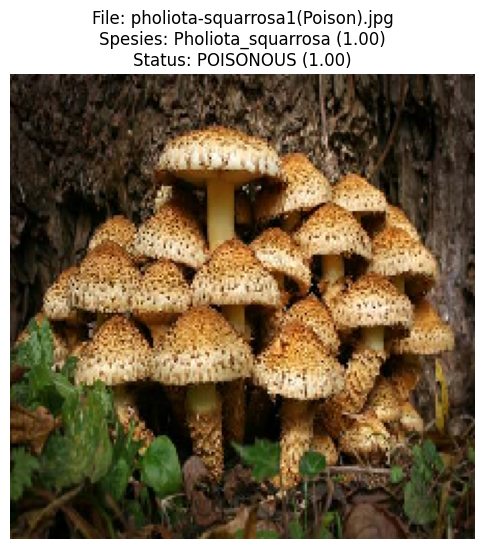

File    : pholiota-squarrosa1(Poison).jpg
Spesies : Pholiota_squarrosa (100.00%)
Status  : POISONOUS (100.00%)
----------------------------------------


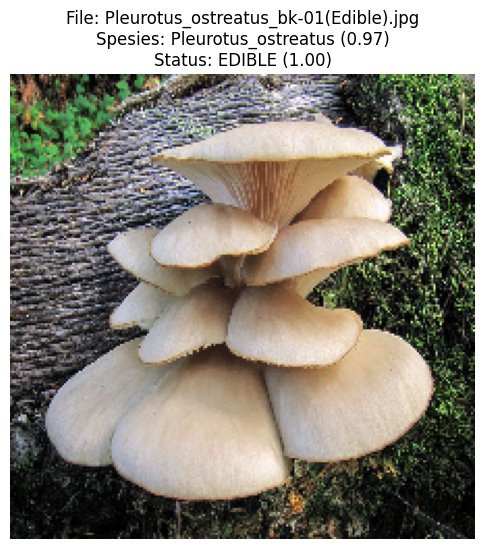

File    : Pleurotus_ostreatus_bk-01(Edible).jpg
Spesies : Pleurotus_ostreatus (96.58%)
Status  : EDIBLE (99.99%)
----------------------------------------


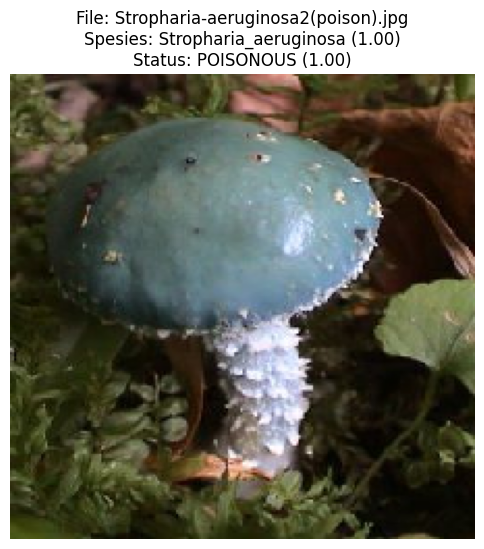

File    : Stropharia-aeruginosa2(poison).jpg
Spesies : Stropharia_aeruginosa (100.00%)
Status  : POISONOUS (100.00%)
----------------------------------------


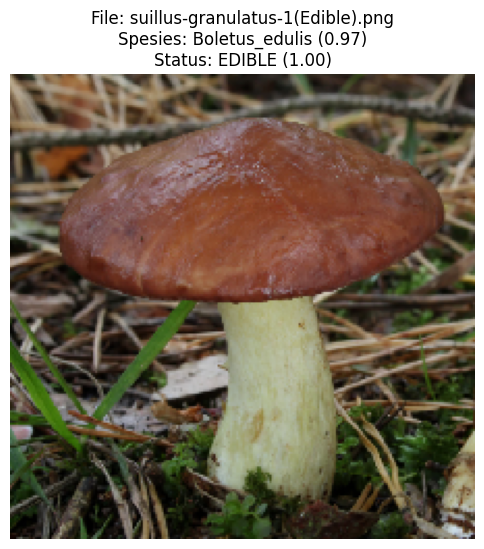

File    : suillus-granulatus-1(Edible).png
Spesies : Boletus_edulis (96.56%)
Status  : EDIBLE (99.95%)
----------------------------------------


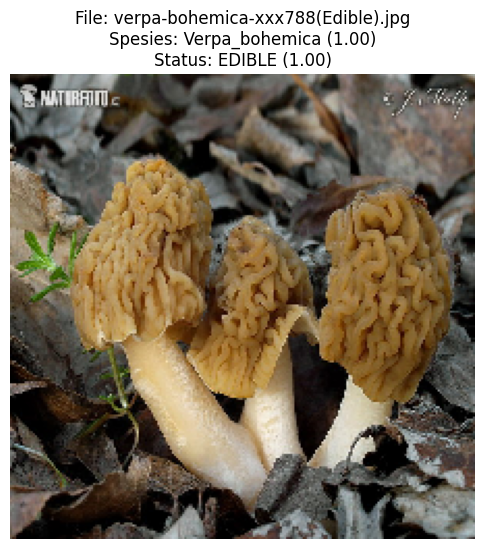

File    : verpa-bohemica-xxx788(Edible).jpg
Spesies : Verpa_bohemica (100.00%)
Status  : EDIBLE (99.86%)
----------------------------------------


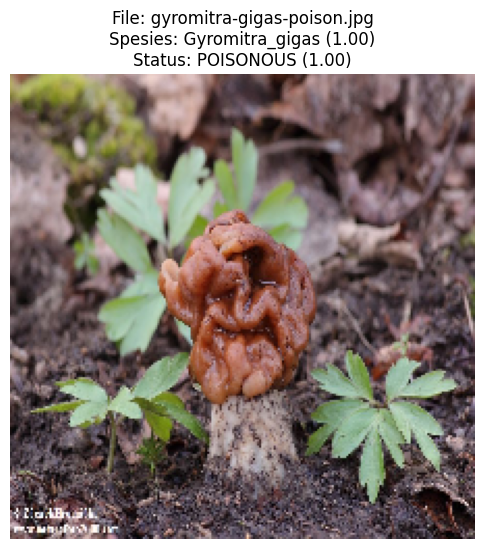

File    : gyromitra-gigas-poison.jpg
Spesies : Gyromitra_gigas (99.98%)
Status  : POISONOUS (99.91%)
----------------------------------------

Prediksi selesai untuk semua gambar!


In [ ]:
#ResNet Klasifikasi Murni (Tanpa YOLO)
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
import os
import json

# KONFIGURASI ---
IMG_SIZE = (224, 224)
model_path = '/content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_resnet_tuned_v4.keras'
json_path = '/content/drive/MyDrive/Dataset_TugasAkhir/Models/class_indices.json'
test_folder = '/content/drive/MyDrive/Test Class Jamur'

# --- 2. LOAD MODEL & MAPPING ---
print("Loading ResNet50 model...")
model = tf.keras.models.load_model(model_path)

print("Loading class mapping...")
with open(json_path) as f:
    class_indices = json.load(f)

# Membalikkan dictionary: dari {nama: indeks} menjadi {indeks: nama}
idx_to_class = {v: k for k, v in class_indices.items()}
target_names = [idx_to_class[i] for i in range(len(idx_to_class))]

print("Model dan Mapping siap!")

# --- 3. FUNGSI PREDIKSI ---
def prediksi_jamur_single(img_path):
    filename = os.path.basename(img_path)

    # A. LOAD & PREPROCESS GAMBAR
    # Gambar langsung diresize ke 224x224 tanpa di-crop YOLO
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Preprocess sesuai standar ResNet50
    img_array = preprocess_input(img_array)

    # B. PREDIKSI MULTI-OUTPUT
    # pred_biner untuk Edible/Poisonous, pred_spesies untuk nama jamur
    pred_biner, pred_spesies = model.predict(img_array, verbose=0)

    prob_biner = pred_biner[0][0]
    probs_spesies = pred_spesies[0]

    # --- LOGIKA BINER ---
    if prob_biner > 0.5:
        hasil_biner = "POISONOUS"
        conf_biner = prob_biner
    else:
        hasil_biner = "EDIBLE"
        conf_biner = 1 - prob_biner

    # --- LOGIKA SPESIES ---
    idx_spesies = np.argmax(probs_spesies)
    hasil_spesies = target_names[idx_spesies]
    conf_spesies = probs_spesies[idx_spesies]

    # --- FILTER UNKNOWN (Jika keyakinan rendah) ---
    if conf_spesies < 0.4:
        hasil_spesies = "UNKNOWN"

    # --- 4. VISUALISASI ---
    plt.figure(figsize=(6, 7))
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"File: {filename}\n"
        f"Spesies: {hasil_spesies} ({conf_spesies:.2f})\n"
        f"Status: {hasil_biner} ({conf_biner:.2f})"
    )
    plt.show()

    # Cetak detail ke konsol
    print(f"File    : {filename}")
    print(f"Spesies : {hasil_spesies} ({conf_spesies*100:.2f}%)")
    print(f"Status  : {hasil_biner} ({conf_biner*100:.2f}%)")
    print("-" * 40)


# --- 4. EKSEKUSI LOOP FOLDER ---
print("\nMemulai prediksi folder...\n")

if not os.path.exists(test_folder):
    print(f"Error: Folder {test_folder} tidak ditemukan!")
else:
    for file in os.listdir(test_folder):
        if file.lower().endswith(('png', 'jpg', 'jpeg')):
            path = os.path.join(test_folder, file)
            prediksi_jamur_single(path)

print("\nPrediksi selesai untuk semua gambar!")